In [1]:
import torch
from torchvision.transforms import functional as F
from PIL import Image
import os

ROOT_DIR = "C:\\Adrianov\\Projects\\Project-Satanael\\"
DEMO_DIR = os.path.join(ROOT_DIR, 'attack_demo')

In [2]:
v5_model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
v5_model.eval()

Using cache found in C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master
C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\utils\general.py:32: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
YOLOv5  2025-7-15 Python-3.13.3 torch-2.6.0+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [3]:
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches

class_names = v5_model.names
label_colors = {i: (random.random(), random.random(), random.random()) for i in range(len(class_names))}

def yolo_plot_predictions(image, preds, threshold=0.7):
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    for *box, conf, cls in preds:
        if conf >= threshold:
            x1, y1, x2, y2 = box
            label = int(cls.item())
            color = label_colors[label]
            label_name = class_names[label]

            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y1, f"{label_name}: {conf:.2f}", color='white',
                    bbox=dict(facecolor=color, alpha=0.5, pad=2), fontsize=10)

    plt.axis('off')
    plt.tight_layout()
    plt.show()

## Naturalistic Patch Attack

### Baseline Unattacked Images

C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


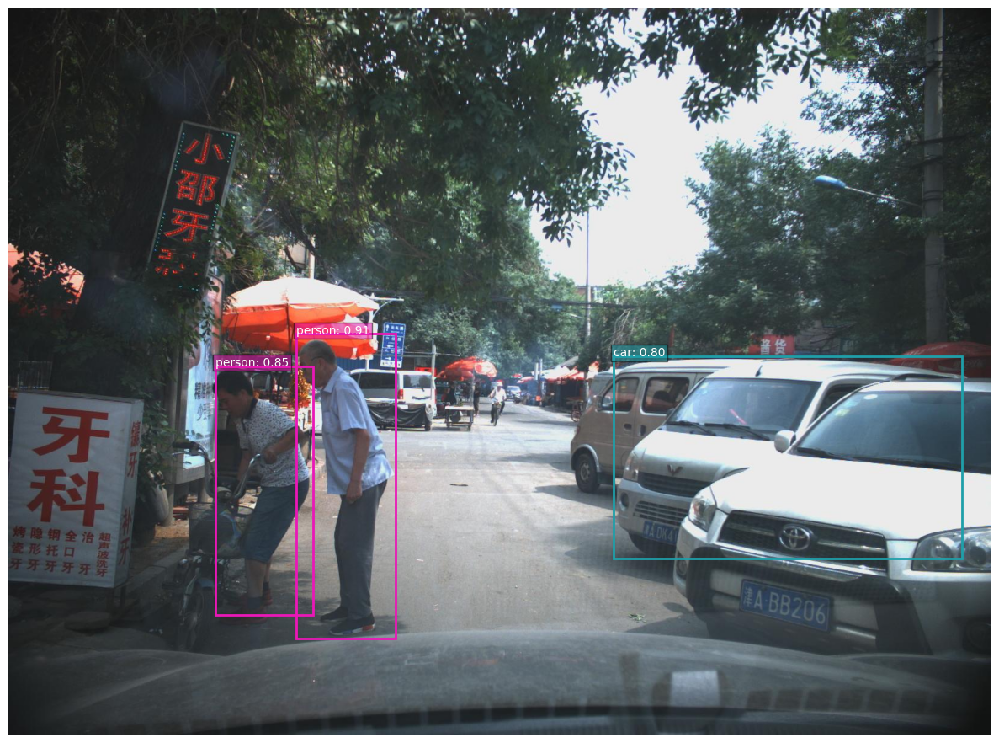

In [18]:
%matplotlib inline

natpatch_ex1 = "1497507290696(1).png"
image_path = os.path.join(DEMO_DIR, natpatch_ex1)
image = Image.open(image_path).convert("RGB")
image_tensor = F.to_tensor(image)  # C x H x W tensor

results = v5_model(image)

preds = results.xyxy[0]

yolo_plot_predictions(image, preds)

## Attacked Image #1

C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


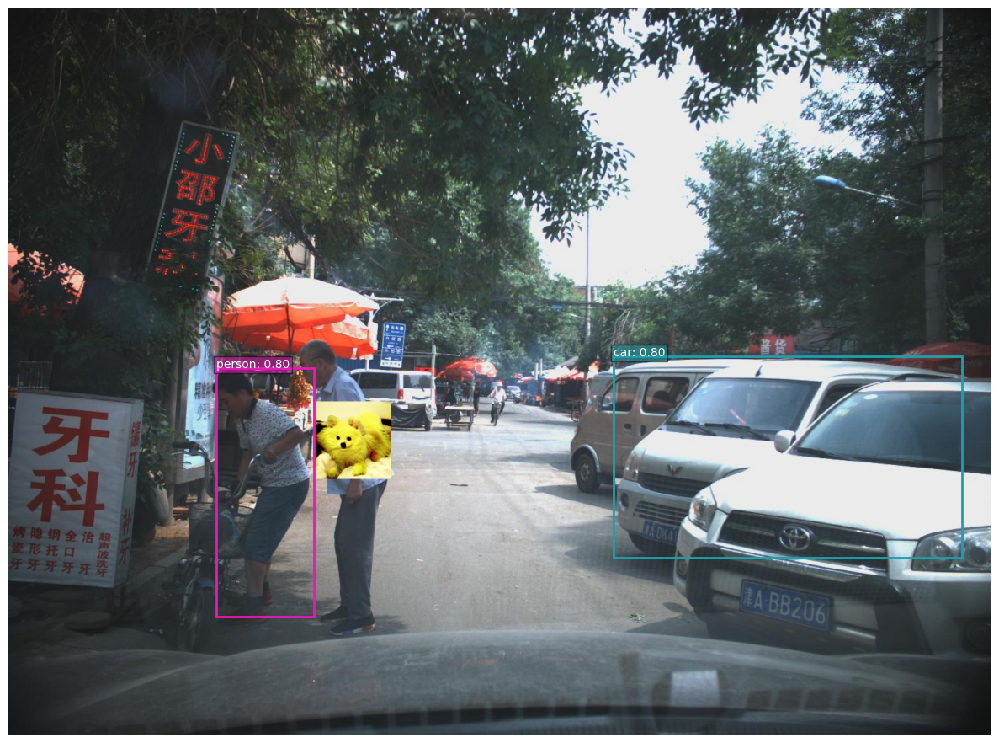

In [20]:
%matplotlib inline

natpatch_ex2 = "1497507290696.png"
image_path = os.path.join(DEMO_DIR, natpatch_ex2)
image = Image.open(image_path).convert("RGB")
image_tensor = F.to_tensor(image)  # C x H x W tensor

results = v5_model(image)

preds = results.xyxy[0]

yolo_plot_predictions(image, preds)

### Attacked Image 2

C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


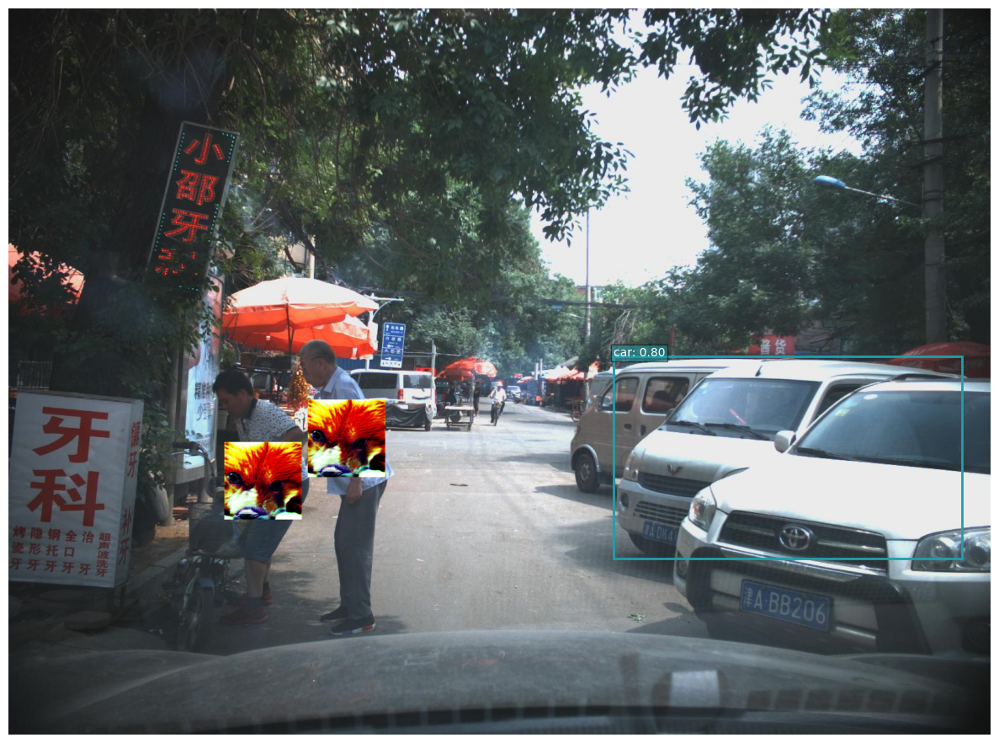

In [24]:
%matplotlib inline

natpatch_ex3 = "1497507290696(5).png"
image_path = os.path.join(DEMO_DIR, natpatch_ex3)
image = Image.open(image_path).convert("RGB")
image_tensor = F.to_tensor(image)  # C x H x W tensor

results = v5_model(image)

preds = results.xyxy[0]

yolo_plot_predictions(image, preds)

## T-SEA Patch

### Unattacked Image
A black patch of the same size is put over the victim object to ensure the lack of detection does not arise from mere occlusion

C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


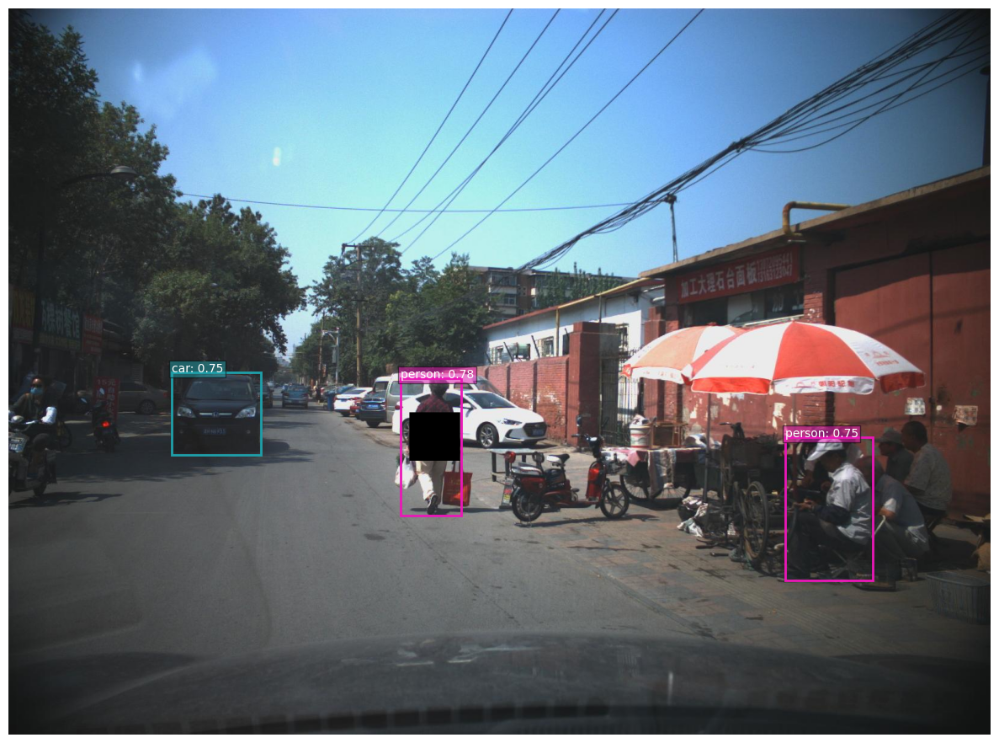

In [27]:
%matplotlib inline

image_path = os.path.join(DEMO_DIR, "1497507290696(8).png")
image = Image.open(image_path).convert("RGB")
image_tensor = F.to_tensor(image)  # C x H x W tensor

results = v5_model(image)

preds = results.xyxy[0]

yolo_plot_predictions(image, preds)

### Attacked Image #1

C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


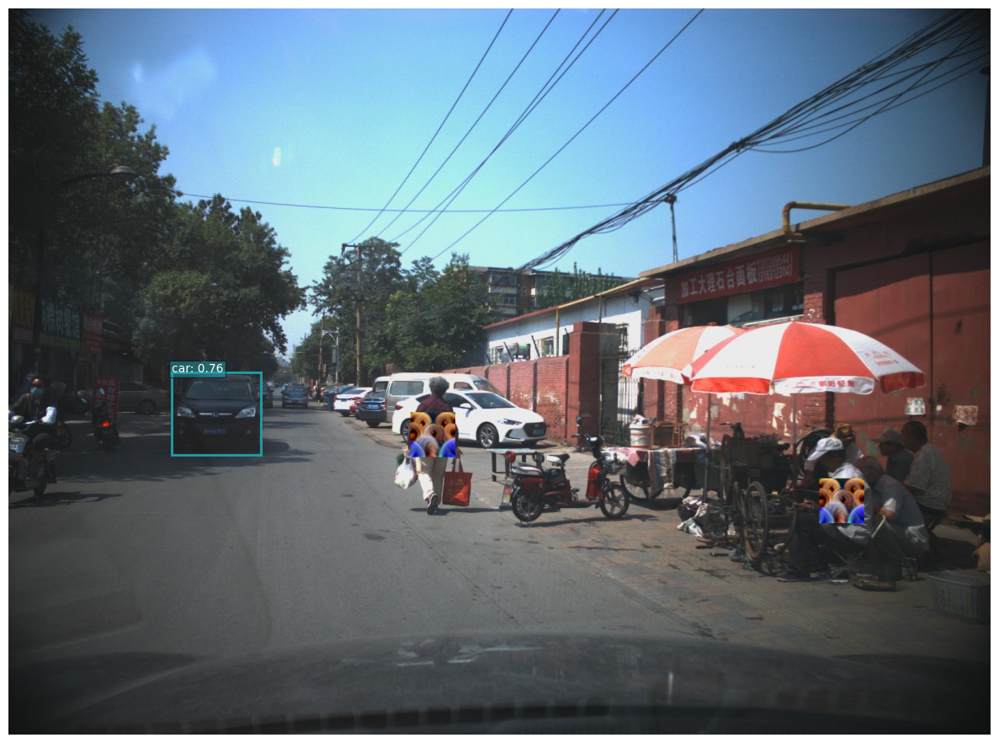

In [30]:
%matplotlib inline

image_path = os.path.join(DEMO_DIR, "1497507290696(7).png")
image = Image.open(image_path).convert("RGB")
image_tensor = F.to_tensor(image)  # C x H x W tensor

results = v5_model(image)

preds = results.xyxy[0]

yolo_plot_predictions(image, preds)

## APRICOT Dataset

### Unresized

C:\Users\adria/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


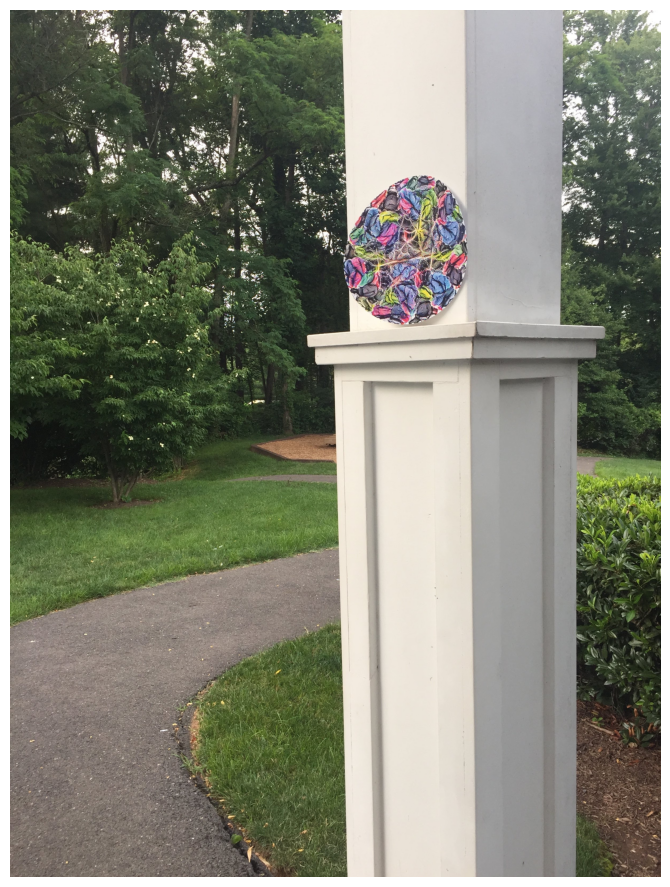

In [4]:
%matplotlib inline

APRICOT_TEST_DIR_ORIG = os.path.join(ROOT_DIR, 'data', 'APRICOTv1.0', 'Images', 'test_PAD')

image_path = os.path.join(APRICOT_TEST_DIR_ORIG, "rrc2_5.jpg")
image = Image.open(image_path).convert("RGB")
image_tensor = F.to_tensor(image)  # C x H x W tensor

results = v5_model(image)

preds = results.xyxy[0]

yolo_plot_predictions(image, preds)

## Benchmarking

In [11]:
import sys
import os
import importlib.util

metrics_path = os.path.abspath("../utils/metrics_eval.py")

spec = importlib.util.spec_from_file_location("metrics_eval", metrics_path)
metrics_eval = importlib.util.module_from_spec(spec)
sys.modules["metrics_eval"] = metrics_eval
spec.loader.exec_module(metrics_eval)

### Benchmark Unattacked Test Set

In [6]:
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

map50 = metrics_eval.evaluate_map50(
    image_dir=os.path.join(ROOT_DIR, 'data', 'tju-dhd', 'images', 'test'),
    label_dir=os.path.join(ROOT_DIR, 'data', 'tju-dhd', 'labels', 'test'),
    class_id=0,  #person
    model=v5_model
)


In [7]:
print(f"mAP@0.5 for class 0: {map50:.4f}")

mAP@0.5 for class 0: 0.4405


### Benchmark Unattacked but Occluded Test Set

In [15]:
warnings.filterwarnings("ignore", category=FutureWarning)

map50 = metrics_eval.evaluate_map50(
    image_dir=os.path.join(ROOT_DIR, 'data', 'tju-dhd', 'occluded', 'images'),
    label_dir=os.path.join(ROOT_DIR, 'data', 'tju-dhd', 'occluded', 'labels'),
    class_id=0,  #person
    model=v5_model
)
print(f"mAP@0.5 for class 0: {map50:.4f}")

mAP@0.5 for class 0: 0.3968


### Benchmark Attacked Test Set (Naturalistic Patch 1)

In [12]:

warnings.filterwarnings("ignore", category=FutureWarning)

map50 = metrics_eval.evaluate_map50(
    image_dir=os.path.join(ROOT_DIR, 'data', 'tju-dhd', 'Patched_Naturalistic1', 'images'),
    label_dir=os.path.join(ROOT_DIR, 'data', 'tju-dhd', 'Patched_Naturalistic1', 'labels'),
    class_id=0,  #person
    model=v5_model
)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [13]:
print(f"mAP@0.5 for class 0: {map50:.4f}")

mAP@0.5 for class 0: 0.2014
